# Week 4

Yay! It's week 4. Last week had a lot of material, this week we only have three components with very little reading. 


## Overview

* A video lecture with a few questions
* An exercise on visualizing geodata using a different set of tools from the ones we played with previously.
* Thinking about visualization, data quality, and binning. Why ***looking at the details of the data before applying fancy methods*** is often important.

## Part 1: More lecturing on dataviz

We begin today by learning more about the theory of visualization, digging into data encodings and representations.

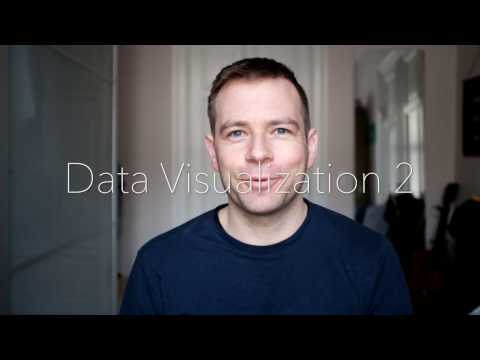

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('zE6Nr8trdrw', width=800, height=450)

> *Excercise:* Some questions about the video. 
>
> * Mention 10 examples of ways we can encode data.
> * Are all encodings created equally? Why not? Can you think of an example from the previous lectures?
> * Mention 3 encodings that are difficult for the human eye to parse. Can you find an example of a visualization online that uses one of those three?
> * Explain in your own words: What is the problem with pie-charts?

</div>

Visualisation maps data to encodings:
- Data: quantative, qualitative, relations between items
- Encoding: Position, length, area, shape... Can also be how one data points relats to another. 

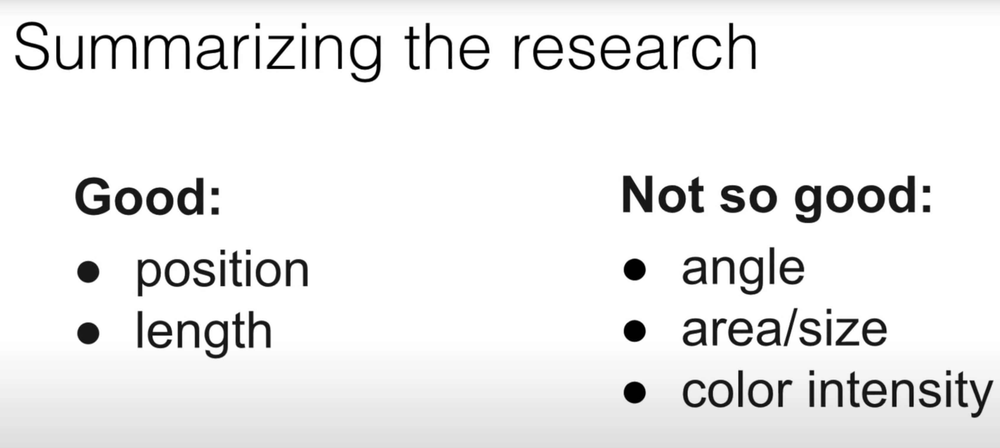


Qualitative daa can be hard to visualise. For example, long form answers. You would probably have to group answers, but you run the risk of intepreting upon the data. 

Relations between data can also be difficult to visualise. Venn diagrams can do this:
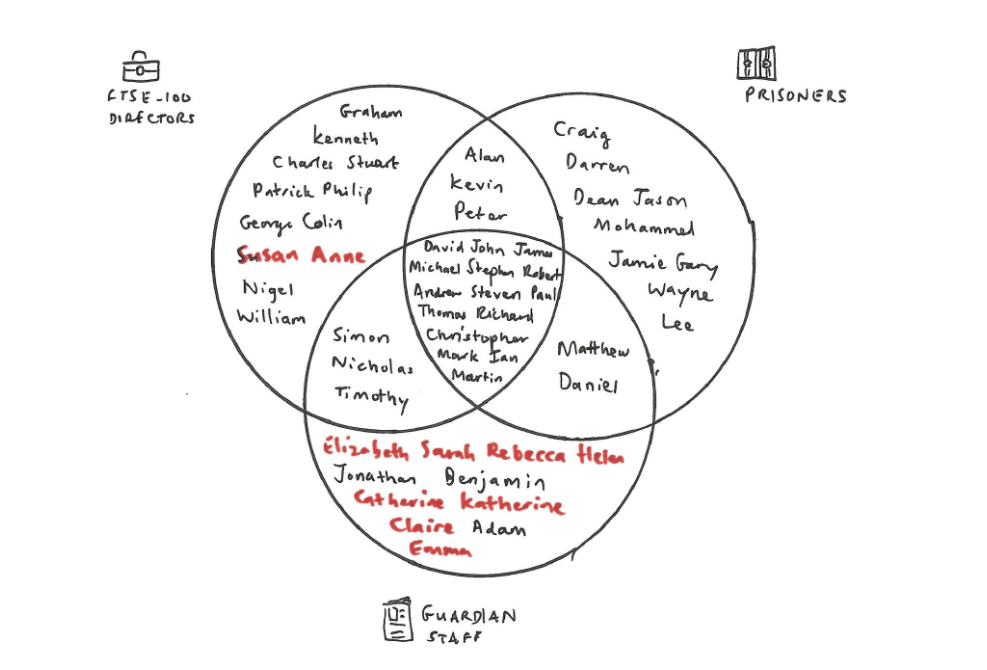

## Part 2: Visualizing geo-data

It turns out that `plotly` (which we used during Week 2) is not the only way of working with geo-data. There are many different ways to go about it. (The more advanced PhD and PostDoc researchers in my group simply use matplotlib, since that provides more control.)

Today, we'll try another library for geodata called [Folium](https://github.com/python-visualization/folium). It's good for you all to try out a few different libraries - remember that data visualization and analysis in Python is all about the ability to use many different tools. 

The exercise below is based on the code illustrated in this nice [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data), so let us start by taking a look at that one.

*Reading*. Read through the following tutorial
 * "How to: Folium for maps, heatmaps & time data". Get it here: https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data. \[**UPDATE 2025**: This is still a great tutorial, but the Stamen tiles are no longer avialible, so some of the plots won't display. You can still run everything, however. \]
 * <font color=gray>You can also experiment with getting your LLM to generate a nice tutorial for you, if you're so inclined.</font>

> *Exercise*: A different take on geospatial data. 
>
>A couple of weeks ago (Part 3 of Week 2), we worked with spacial data by using color-intensity of shapefiles to show the counts of certain crimes within those individual areas. Today, we look at studying geospatial data by plotting raw data points as well as heatmaps on top of actual maps.
> 


> * First start by plotting a map of San Francisco with a nice tight zoom. Simply use the command `folium.Map([lat, lon], zoom_start=13)`, where you'll have to look up San Francisco's longitude and latitude.
> * Next, use the the coordinates for SF City Hall `37.77919, -122.41914` to indicate its location on the map with a nice, pop-up enabled marker.

In [13]:
#folium.Map([lat, lon], zoom_start=13)  ({"lat": 37.7749, "lon": -122.4194}) San Francisco's longitude and latitude.

# Create a map centered at San Francisco's latitude and longitude
import folium
sf_map = folium.Map(location=[37.7249, -122.4394], zoom_start=12)
# Create marker for SF City Hall `37.77919, -122.41914`
marker = folium.Marker([37.77919, -122.41914], popup='SF City Hall')
#Use marker
sf_map.add_child(marker)

#Display map
sf_map

> * Now, let's plot some more data (no need for pop-ups this time). Select a couple of months of data for `'DRUG/NARCOTIC'` and draw a little dot for each arrest for those two months. You could, for example, choose June-July 2016, but you can choose anything you like - the main concern is to not have too many points as this uses a lot of memory and makes Folium behave non-optimally. 
> We can call this kind of visualization a *point scatter plot*.



In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Load complete dataset
df = pd.read_csv('../data/Police_Department_Incident_Reports_Complete.csv')

In [33]:
#Point scatter plot on map

# Create a map centered at San Francisco's latitude and longitude
sf_map = folium.Map(location=[37.7249, -122.4394], zoom_start=12)

#Filter to only drug/narcotic incidents
drug_incidents = df[df['Category'] == 'DRUG/NARCOTIC']
#Find unique days with Day Month Year
drug_incidents_day = drug_incidents.groupby(['Year', 'Month', 'Day', 'Latitude (Y)','Longitude (X)']).size().reset_index(name='Count') #By using year, month and day we get the number of crimes per day

drug_incidents_day = drug_incidents_day[drug_incidents_day['Year'] == 2010] #Filter to only 2010

# Add a marker for each incident
for _, row in drug_incidents_day.iterrows():
    row = row.to_dict()
    folium.CircleMarker(location=[row['Latitude (Y)'], row['Longitude (X)']],
                        radius=row['Count'] / 5, popup=row['Count']).add_to(sf_map)
    
# Display the map
sf_map

> *Exercise*: Heatmaps.
> * Now, let's play with **heatmaps**. You can figure out the appropriate commands by grabbing code from the main [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data)) and modifying to suit your needs.
>    * To create your first heatmap, grab all arrests for the category `'PROSTITUTION'` across all time. Play with parameters to get plots you like.
>    * Now, comment on the differences between scatter plots and heatmaps. 
>      - What can you see using the scatter-plots that you can't see using the heatmaps? 
>      - And *vice versa*: what does the heatmaps help you see that's difficult to distinguish in the scatter-plots?
>    * Play around with the various parameters for heatmaps. You can find a list here: https://python-visualization.github.io/folium/plugins.html
>    * Comment on the effect on the various parameters for the heatmaps. How do they change the picture? (for example, try ,`radius=10` and `blur=5` - what happens to the image?).

In [37]:
from folium import plugins
from folium.plugins import HeatMap
#Heatmaps
map_prostitution = folium.Map(location=[37.7249, -122.4394], zoom_start=12)

prostitution_incidents = df[df['Category'] == 'PROSTITUTION']

# Ensure you're handing it floats
prostitution_incidents['Latitude (Y)'] = prostitution_incidents['Latitude (Y)'].astype(float)
prostitution_incidents['Longitude (X)'] = prostitution_incidents['Longitude (X)'].astype(float)

# Filter the DF for rows, then columns, then remove NaNs
heat_df = prostitution_incidents[['Latitude (Y)', 'Longitude (X)']]
heat_df = heat_df.dropna(axis=0, subset=['Latitude (Y)','Longitude (X)'])

# List comprehension to make out list of lists
heat_data = [[row['Latitude (Y)'],row['Longitude (X)']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(map_prostitution)

# Display the map
map_prostitution

C:\Users\Dreun\AppData\Local\Temp\ipykernel_8336\3785094415.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prostitution_incidents['Latitude (Y)'] = prostitution_incidents['Latitude (Y)'].astype(float)
C:\Users\Dreun\AppData\Local\Temp\ipykernel_8336\3785094415.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prostitution_incidents['Longitude (X)'] = prostitution_incidents['Longitude (X)'].astype(float)


For the final element of working with heatmaps, let's now use the cool Folium functionality `HeatMapWithTime` to create a visualization of how the patterns of your favorite crime-type changes over time.

> *Exercise*: Heatmap movies. This exercise is a bit more independent than above - you get to make all the choices.
> * Start by choosing your favorite crimetype. Prefereably one with spatial patterns that change over time (use your data-exploration from the previous lectures to choose a good one).
> * Now, choose a time-resolution. You could plot daily, weekly, monthly datasets to plot in your movie. Again the goal is to find interesting temporal patterns to display. We want at least 20 frames though.
> * Create the movie using `HeatMapWithTime`.
> * Comment on your results: 
>   - What patterns does your movie reveal?
>   - Motivate/explain the reasoning behind your choice of crimetype and time-resolution. 

In [49]:
## HEATMAPS over time

from folium.plugins import HeatMapWithTime
import pandas as pd

# Add a date column based on Day Month Year
prostitution_incidents['Date'] = pd.to_datetime(prostitution_incidents['Month'].astype(str)
                                                + '-' + prostitution_incidents['Day'].astype(str)
                                                + '-' + prostitution_incidents['Year'].astype(str))

# Group by date and create heat data
heat_data = []
for date, group in prostitution_incidents.groupby(['Year','Month']):
    heat_data.append(group[['Latitude (Y)', 'Longitude (X)']].values.tolist())

# Create map
map_prostitution = folium.Map(location=[37.7749, -122.4194], zoom_start=12)

# Add HeatMapWithTime to map
HeatMapWithTime(heat_data, radius=15).add_to(map_prostitution)

# Display the map
map_prostitution

C:\Users\Dreun\AppData\Local\Temp\ipykernel_8336\3128337680.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prostitution_incidents['Date'] = pd.to_datetime(prostitution_incidents['Month'].astype(str)


# Part 3: Putting everything you've learned to work!!

Now you've learned about lots of time-series analysis tricks and visualization. That means it's time for you to think for yourself with a slightly more independent exercise.

> *Exercise*: Using all the tools to understand the temporal trends of prostitution in SF over time.
> * It's quite simple really, I'd like you to present your own analysis of what happens to the `PROSTITUTION`
> crime type in SF over time.
>   - Hint: So think about trends over time, does every district show the same behavior?, or the same beahavior over time?, are there hotspots?, etc. A fancy way of saying this is: think about quantifying and explaining spatio-temporal patterns.
> * As an extra little thing, I also want you to reflect on the *role of data errors* in an analysis. Data errors could be things like imprecise GPS points, or imprecise recording of time.

<div class="alert alert-block alert-info">
As almost always, it's OK to use LLMs to help you make your analysis better. But start by thinking about the data with your own human brain, start by coming up with what you want to know and which visualizations could help you understand things better. The thing I hope <b>does not happen</b> is that you use an LLM to come up with the ideas for you - or simply doing the analysis for you (because if that's your choice, you won't learn anything).
</div>

Text(0, 0.5, 'Number of incidents')

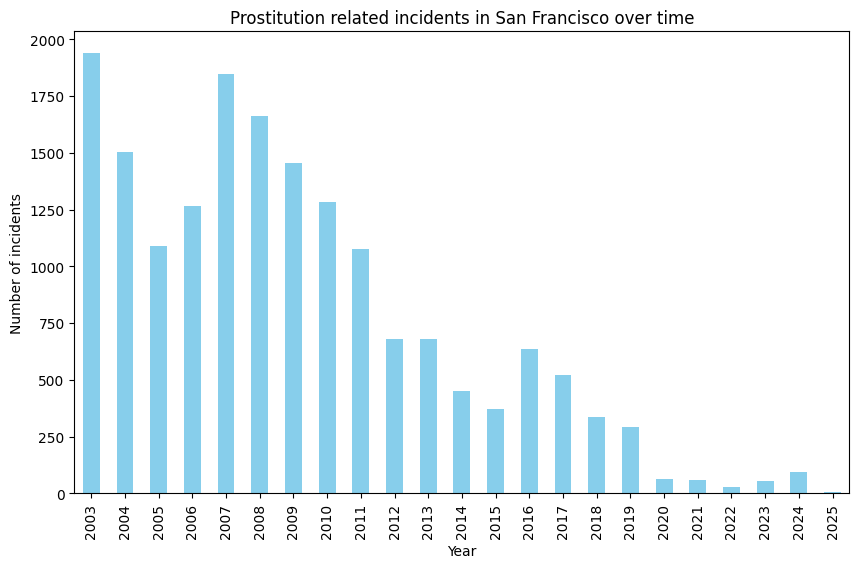

In [ ]:
#PROSTITUTION in San Francisco over time

#Filtering the data for prostitution related incidents
df_prostitution = df[df['Category'] == 'PROSTITUTION']
#Bar chart over ALL prostitution crimes per year

#Grouping by year
df_prostitution_year = df_prostitution.groupby('Year').size()
#Display the bar chart
plt.figure(figsize=(10,6))
df_prostitution_year.plot(kind='bar', color='skyblue')
plt.title('Prostitution related incidents in San Francisco over time')
plt.xlabel('Year')
plt.ylabel('Number of incidents')

We expect an overall decrease. But let's analyse the geographical changes in San Fransisco. 

In [ ]:
from folium.plugins import MarkerCluster

#Instead of markers, let's try using circles to represent the number of incidents (clusters)

# Create a map centered at San Francisco's latitude and longitude
sf_map = folium.Map(location=[37.7249, -122.4394], zoom_start=12)

# Filter to only prostitution incidents
prostitution_incidents = df[df['Category'] == 'PROSTITUTION']
# Find unique days with Day Month Year
prostitution_incidents_day = prostitution_incidents.groupby(['Year', 'Month', 'Day', 'Latitude (Y)', 'Longitude (X)']).size().reset_index(name='Count')

# Filter to crimes only in San Francisco
prostitution_incidents_day = prostitution_incidents_day[prostitution_incidents_day['Latitude (Y)'] > 37.7]
prostitution_incidents_day = prostitution_incidents_day[prostitution_incidents_day['Longitude (X)'] < -122.35]

# Save each map per year to variable
maps = []

# Sub plot per year
for year in prostitution_incidents_day['Year'].unique():
    sf_map = folium.Map(location=[37.7249, -122.4394], zoom_start=12)
    prostitution_incidents_year = prostitution_incidents_day[prostitution_incidents_day['Year'] == year]
    
    # Create a MarkerCluster
    marker_cluster = MarkerCluster().add_to(sf_map)
    
    # Add a marker for each incident
    for _, row in prostitution_incidents_year.iterrows():
        row = row.to_dict()
        folium.CircleMarker(location=[row['Latitude (Y)'], row['Longitude (X)']],
                            radius=row['Count'] / 5, popup=row['Count']).add_to(marker_cluster)
    
    maps.append(sf_map)
    sf_map.save(f'../plots/maps/prostitution_{year}_cluster.html')